In [ ]:
!pip install -i https://test.pypi.org/simple/ supervision==0.3.0
!pip install -q transformers
!pip install -q pytorch-lightning
!pip install -q roboflow
!pip install -q timm

Looking in indexes: https://test.pypi.org/simple/
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 15.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 891.4/891.4 kB 26.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.8 MB/s eta 0:00:00


In [ ]:
import torch
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)

import roboflow
import supervision
import transformers
import pytorch_lightning

print(
    "roboflow:", roboflow.__version__,
    "; supervision:", supervision.__version__,
    "; transformers:", transformers.__version__,
    "; pytorch_lightning:", pytorch_lightning.__version__
)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.5 ; cuda:  cu121
roboflow: 1.1.49 ; supervision: 0.3.0 ; transformers: 4.44.2 ; pytorch_lightning: 2.4.0


In [ ]:
%cd {HOME}
!wget https://media.roboflow.com/notebooks/examples/dog.jpeg

[Errno 2] No such file or directory: '{HOME}'
/content
--2024-11-09 03:50:01--  https://media.roboflow.com/notebooks/examples/dog.jpeg
Resolving media.roboflow.com (media.roboflow.com)... 34.110.133.209
Connecting to media.roboflow.com (media.roboflow.com)|34.110.133.209|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 106055 (104K) [image/jpeg]
Saving to: ‘dog.jpeg’

dog.jpeg            100%[===================>] 103.57K  --.-KB/s    in 0.001s  

2024-11-09 03:50:01 (124 MB/s) - ‘dog.jpeg’ saved [106055/106055]



In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
import os

IMAGE_NAME = "dog.jpeg"
IMAGE_PATH = os.path.join(HOME, IMAGE_NAME)

In [ ]:
import torch
from transformers import DetrForObjectDetection, DetrImageProcessor


# settings
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
CHECKPOINT = 'facebook/detr-resnet-50'
CONFIDENCE_TRESHOLD = 0.5
IOU_TRESHOLD = 0.8

image_processor = DetrImageProcessor.from_pretrained(CHECKPOINT)
model = DetrForObjectDetection.from_pretrained(CHECKPOINT)
model.to(DEVICE)


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


preprocessor_config.json:   0%|          | 0.00/290 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.59k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      

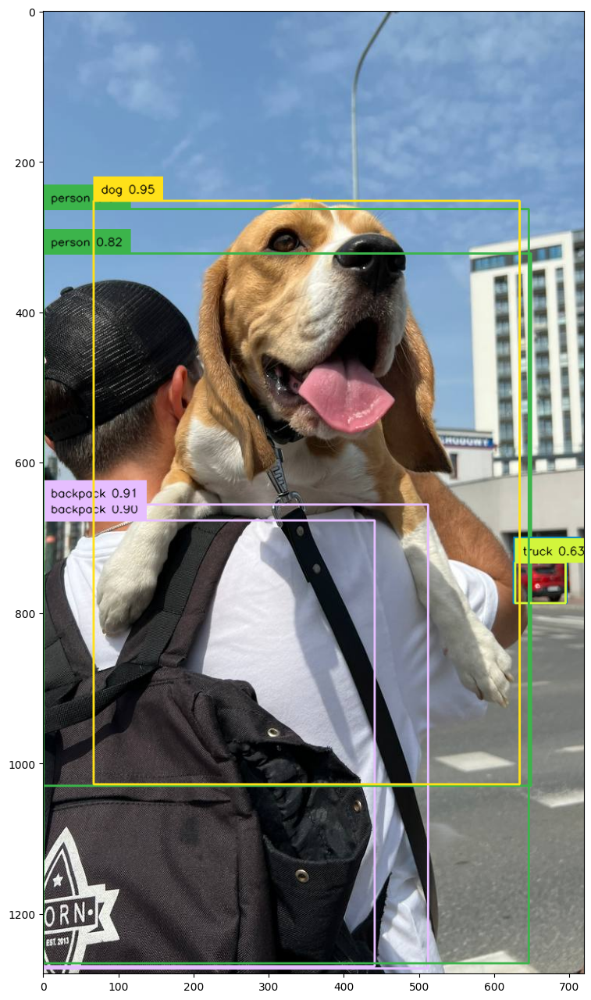

In [ ]:
import cv2
import torch
import supervision as sv


with torch.no_grad():

    # load image and predict
    image = cv2.imread(IMAGE_PATH)
    inputs = image_processor(images=image, return_tensors='pt').to(DEVICE)
    outputs = model(**inputs)

    # post-process
    target_sizes = torch.tensor([image.shape[:2]]).to(DEVICE)
    results = image_processor.post_process_object_detection(
        outputs=outputs,
        threshold=CONFIDENCE_TRESHOLD,
        target_sizes=target_sizes
    )[0]

# annotate
detections = sv.Detections.from_transformers(transformers_results=results)

labels = [
    f"{model.config.id2label[class_id]} {confidence:0.2f}"
    for _, confidence, class_id, _
    in detections
]

box_annotator = sv.BoxAnnotator()
frame = box_annotator.annotate(scene=image, detections=detections, labels=labels)

%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

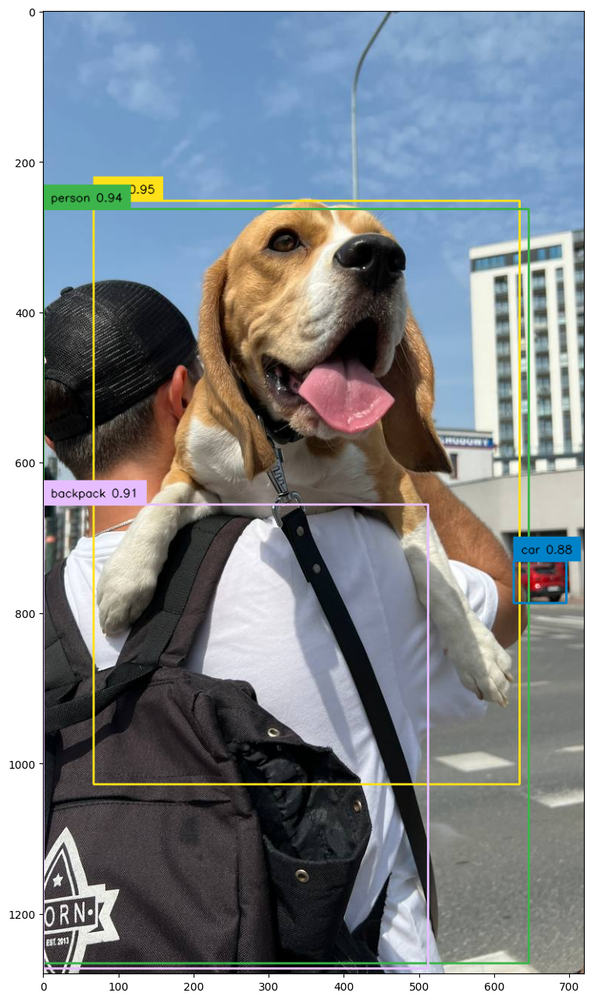

In [ ]:
import cv2
import torch
import supervision as sv


with torch.no_grad():

    # load image and predict
    image = cv2.imread(IMAGE_PATH)
    inputs = image_processor(images=image, return_tensors='pt').to(DEVICE)
    outputs = model(**inputs)

    # post-process
    target_sizes = torch.tensor([image.shape[:2]]).to(DEVICE)
    results = image_processor.post_process_object_detection(
        outputs=outputs,
        threshold=CONFIDENCE_TRESHOLD,
        target_sizes=target_sizes
    )[0]

# annotate
detections = sv.Detections.from_transformers(transformers_results=results).with_nms(threshold=IOU_TRESHOLD)

labels = [
    f"{model.config.id2label[class_id]} {confidence:0.2f}"
    for _, confidence, class_id, _
    in detections
]

box_annotator = sv.BoxAnnotator()
frame = box_annotator.annotate(scene=image, detections=detections, labels=labels)

%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="JVI2hbhwmy9AaWs2yVwU")
project = rf.workspace("eduarfit15").project("xnradiogra")
version = project.version(1)
dataset = version.download("coco")


/content/datasets
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to XÑRadiogra-1 in coco:: 100%|██████████| 4503/4503 [00:00<00:00, 5828.20it/s]


In [ ]:
dataset.location

'/content/datasets/XÑRadiogra-1'

In [ ]:
import os
import torchvision


# settings
ANNOTATION_FILE_NAME = "_annotations.coco.json"
TRAIN_DIRECTORY = os.path.join(dataset.location, "train")
VAL_DIRECTORY = os.path.join(dataset.location, "valid")
TEST_DIRECTORY = os.path.join(dataset.location, "test")


class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(
        self,
        image_directory_path: str,
        image_processor,
        train: bool = True
    ):
        annotation_file_path = os.path.join(image_directory_path, ANNOTATION_FILE_NAME)
        super(CocoDetection, self).__init__(image_directory_path, annotation_file_path)
        self.image_processor = image_processor

    def __getitem__(self, idx):
        images, annotations = super(CocoDetection, self).__getitem__(idx)
        image_id = self.ids[idx]
        annotations = {'image_id': image_id, 'annotations': annotations}
        encoding = self.image_processor(images=images, annotations=annotations, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze()
        target = encoding["labels"][0]

        return pixel_values, target


TRAIN_DATASET = CocoDetection(
    image_directory_path=TRAIN_DIRECTORY,
    image_processor=image_processor,
    train=True)
VAL_DATASET = CocoDetection(
    image_directory_path=VAL_DIRECTORY,
    image_processor=image_processor,
    train=False)
TEST_DATASET = CocoDetection(
    image_directory_path=TEST_DIRECTORY,
    image_processor=image_processor,
    train=False)

print("Number of training examples:", len(TRAIN_DATASET))
print("Number of validation examples:", len(VAL_DATASET))
print("Number of test examples:", len(TEST_DATASET))

loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Number of training examples: 3933
Number of validation examples: 375
Number of test examples: 187


Image #748


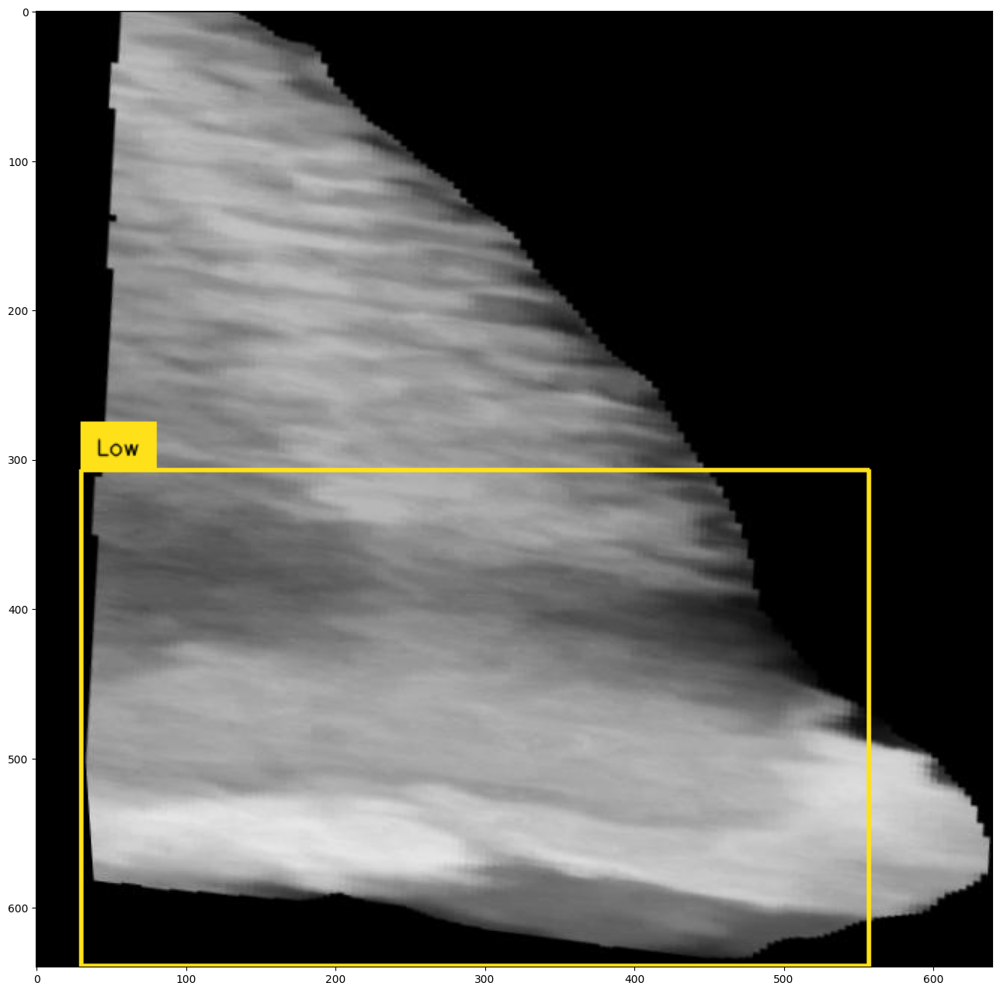

In [ ]:
import random
import cv2
import numpy as np


# select random image
image_ids = TRAIN_DATASET.coco.getImgIds()
image_id = random.choice(image_ids)
print('Image #{}'.format(image_id))

# load image and annotatons
image = TRAIN_DATASET.coco.loadImgs(image_id)[0]
annotations = TRAIN_DATASET.coco.imgToAnns[image_id]
image_path = os.path.join(TRAIN_DATASET.root, image['file_name'])
image = cv2.imread(image_path)

# annotate
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)

# we will use id2label function for training
categories = TRAIN_DATASET.coco.cats
id2label = {k: v['name'] for k,v in categories.items()}

labels = [
    f"{id2label[class_id]}"
    for _, _, class_id, _
    in detections
]

box_annotator = sv.BoxAnnotator()
frame = box_annotator.annotate(scene=image, detections=detections, labels=labels)

%matplotlib inline
sv.show_frame_in_notebook(image, (16, 16))

In [ ]:
from torch.utils.data import DataLoader

def collate_fn(batch):
    # DETR authors employ various image sizes during training, making it not possible
    # to directly batch together images. Hence they pad the images to the biggest
    # resolution in a given batch, and create a corresponding binary pixel_mask
    # which indicates which pixels are real/which are padding
    pixel_values = [item[0] for item in batch]
    encoding = image_processor.pad(pixel_values, return_tensors="pt")
    labels = [item[1] for item in batch]
    return {
        'pixel_values': encoding['pixel_values'],
        'pixel_mask': encoding['pixel_mask'],
        'labels': labels
    }

TRAIN_DATALOADER = DataLoader(dataset=TRAIN_DATASET, collate_fn=collate_fn, batch_size=4, shuffle=True)
VAL_DATALOADER = DataLoader(dataset=VAL_DATASET, collate_fn=collate_fn, batch_size=4)
TEST_DATALOADER = DataLoader(dataset=TEST_DATASET, collate_fn=collate_fn, batch_size=4)

In [ ]:
import pytorch_lightning as pl
from transformers import DetrForObjectDetection
import torch

class Detr(pl.LightningModule):

    def __init__(self, lr, lr_backbone, weight_decay):
        super().__init__()
        self.model = DetrForObjectDetection.from_pretrained(
            pretrained_model_name_or_path=CHECKPOINT,
            num_labels=len(id2label),
            ignore_mismatched_sizes=True
        )

        self.lr = lr
        self.lr_backbone = lr_backbone
        self.weight_decay = weight_decay

    def forward(self, pixel_values, pixel_mask):
        return self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    def common_step(self, batch, batch_idx):
        pixel_values = batch["pixel_values"]
        pixel_mask = batch["pixel_mask"]
        labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]

        outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)

        # Extraer la pérdida total y el diccionario de pérdidas
        loss = outputs.loss
        loss_dict = outputs.loss_dict

        # Imprimir el loss_dict en la primera iteración para ver todas las claves disponibles
        if batch_idx == 0:
            print("Contenido de loss_dict:", loss_dict)

        # Extraer la pérdida de caja delimitadora específica
        loss_bbox = loss_dict.get("loss_bbox", torch.tensor(0.0))

        return loss, loss_bbox, loss_dict

    def training_step(self, batch, batch_idx):
        loss, loss_bbox, loss_dict = self.common_step(batch, batch_idx)

        # Registrar las pérdidas con self.log para obtener promedios por época
        self.log("training_loss", loss, on_epoch=True, prog_bar=True)
        self.log("train_loss_bbox", loss_bbox, on_epoch=True, prog_bar=True)

        # Quitar el registro individual para loss_bbox en el bucle para evitar duplicados
        for k, v in loss_dict.items():
            if k != "loss_bbox":  # Evitar registrar de nuevo `train_loss_bbox`
                self.log("train_" + k, v.item(), on_epoch=True)

        return loss

    def validation_step(self, batch, batch_idx):
        loss, loss_bbox, loss_dict = self.common_step(batch, batch_idx)

        # Registrar las pérdidas de validación
        self.log("validation_loss", loss, on_epoch=True, prog_bar=True)
        self.log("valid_loss_bbox", loss_bbox, on_epoch=True, prog_bar=True)

        # Quitar el registro individual para loss_bbox en el bucle para evitar duplicados
        for k, v in loss_dict.items():
            if k != "loss_bbox":  # Evitar registrar de nuevo `valid_loss_bbox`
                self.log("validation_" + k, v.item(), on_epoch=True)

        return loss

    def configure_optimizers(self):
        # Configuración del optimizador con tasas de aprendizaje diferentes para el backbone y el resto del modelo
        param_dicts = [
            {
                "params": [p for n, p in self.named_parameters() if "backbone" not in n and p.requires_grad]
            },
            {
                "params": [p for n, p in self.named_parameters() if "backbone" in n and p.requires_grad],
                "lr": self.lr_backbone,
            },
        ]
        return torch.optim.AdamW(param_dicts, lr=self.lr, weight_decay=self.weight_decay)

    def train_dataloader(self):
        return TRAIN_DATALOADER

    def val_dataloader(self):
        return VAL_DATALOADER


In [ ]:
model = Detr(lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4)

batch = next(iter(TRAIN_DATALOADER))
outputs = model(pixel_values=batch['pixel_values'], pixel_mask=batch['pixel_mask'])

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DetrForObjectDetection were not initialized from the model checkpoin

In [ ]:
outputs.logits.shape

torch.Size([4, 100, 5])

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import os

# Directorio donde están guardados los checkpoints en Google Drive
checkpoint_dir = '/content/Checkpoints/'

# Obtener el último checkpoint
checkpoints = sorted(os.listdir(checkpoint_dir))
last_checkpoint = os.path.join(checkpoint_dir, checkpoints[-1])  # El más reciente
print(f'Último checkpoint: {last_checkpoint}')


Último checkpoint: /content/Checkpoints/model-epoch=391.ckpt


In [ ]:
import csv
import os
import torch
from pytorch_lightning.callbacks import ModelCheckpoint, Callback
from pytorch_lightning import Trainer
from pytorch_lightning.loggers import TensorBoardLogger
from transformers import DetrForObjectDetection, DetrImageProcessor

# Definir las épocas máximas
MAX_EPOCHS = 400

# Ruta a la carpeta de logs general
log_dir = "/content/datasets/lightning_logs"  # Ruta a `lightning_logs`, sin `version_0`

# Crear un logger de TensorBoard específico para `version_0`
tb_logger = TensorBoardLogger(
    save_dir=log_dir,
    name="",  # Deja el nombre vacío para que no cree subcarpetas adicionales
    version="version_0"  # Esto fuerza el uso de `version_0`
)

# Callback para guardar el modelo en cada época
checkpoint_callback = ModelCheckpoint(
    dirpath="/content/Checkpoints/",
    filename="model-{epoch:02d}",
    save_top_k=-1,
    every_n_epochs=1,  # Guardar el checkpoint cada 2 épocas
    save_weights_only=False
)

# Callback personalizado para guardar los valores de loss y loss_bbox en un archivo CSV
class LossLoggerCallback(Callback):
    def __init__(self, csv_path="/content/Checkpoints/loss_log.csv"):
        self.csv_path = csv_path
        # Crear el archivo CSV si no existe y agregar encabezados
        if not os.path.exists(self.csv_path):
            with open(self.csv_path, mode="w", newline="") as file:
                writer = csv.writer(file)
                writer.writerow(["epoch", "training_loss", "validation_loss", "train_loss_bbox", "valid_loss_bbox"])

    def on_epoch_end(self, trainer, pl_module):
        # Obtener training_loss, validation_loss, train_loss_bbox y valid_loss_bbox
        training_loss = trainer.callback_metrics.get("training_loss", torch.tensor(float("nan"))).item()
        validation_loss = trainer.callback_metrics.get("validation_loss", torch.tensor(float("nan"))).item()
        train_loss_bbox = trainer.callback_metrics.get("train_loss_bbox", torch.tensor(float("nan"))).item()
        valid_loss_bbox = trainer.callback_metrics.get("valid_loss_bbox", torch.tensor(float("nan"))).item()

        # Escribir los valores en el archivo CSV
        with open(self.csv_path, mode="a", newline="") as file:
            writer = csv.writer(file)
            writer.writerow([trainer.current_epoch, training_loss, validation_loss, train_loss_bbox, valid_loss_bbox])

# Configurar el Trainer con el logger específico de `version_0`
trainer = Trainer(
    devices=1,
    accelerator="gpu",
    max_epochs=MAX_EPOCHS,
    gradient_clip_val=0.1,
    accumulate_grad_batches=8,
    log_every_n_steps=450,  # Registrar logs en cada 450 pasos
    logger=tb_logger,  # Usar el logger configurado para `version_0`
    callbacks=[checkpoint_callback, LossLoggerCallback()]  # Agregar el callback de registro de pérdidas
)

# Reanudar el entrenamiento desde el último checkpoint
trainer.fit(model, ckpt_path=last_checkpoint)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /content/Checkpoints exists and is not empty.
INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/Checkpoints/model-epoch=391.ckpt
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/call.py:273: Be aware that when using `ckpt_path`, callbacks used to create the checkpoint need to be provided during `Trainer` instantiation. Please add the following callbacks: ["ModelCheckpoint{'monitor': None, 'mode': 'min', 'every_n_train_steps': 0, 'every_n_epochs': 2, 'train_time_interval': None}"].
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pyt

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Contenido de loss_dict: {'loss_ce': tensor(0.9882, device='cuda:0'), 'loss_bbox': tensor(0.0916, device='cuda:0'), 'loss_giou': tensor(0.1266, device='cuda:0'), 'cardinality_error': tensor(0., device='cuda:0')}


/usr/local/lib/python3.10/dist-packages/pytorch_lightning/utilities/data.py:78: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 4. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Training: |          | 0/? [00:00<?, ?it/s]

Contenido de loss_dict: {'loss_ce': tensor(0.0002, device='cuda:0', grad_fn=<NllLoss2DBackward0>), 'loss_bbox': tensor(0.0092, device='cuda:0', grad_fn=<DivBackward0>), 'loss_giou': tensor(0.0145, device='cuda:0', grad_fn=<DivBackward0>), 'cardinality_error': tensor(0., device='cuda:0')}


/usr/local/lib/python3.10/dist-packages/pytorch_lightning/utilities/data.py:78: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 1. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Validation: |          | 0/? [00:00<?, ?it/s]

Contenido de loss_dict: {'loss_ce': tensor(1.2836, device='cuda:0'), 'loss_bbox': tensor(0.0958, device='cuda:0'), 'loss_giou': tensor(0.1604, device='cuda:0'), 'cardinality_error': tensor(0.5000, device='cuda:0')}


/usr/local/lib/python3.10/dist-packages/pytorch_lightning/utilities/data.py:78: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 3. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Contenido de loss_dict: {'loss_ce': tensor(0.0011, device='cuda:0', grad_fn=<NllLoss2DBackward0>), 'loss_bbox': tensor(0.0084, device='cuda:0', grad_fn=<DivBackward0>), 'loss_giou': tensor(0.0191, device='cuda:0', grad_fn=<DivBackward0>), 'cardinality_error': tensor(0., device='cuda:0')}


Validation: |          | 0/? [00:00<?, ?it/s]

Contenido de loss_dict: {'loss_ce': tensor(1.0997, device='cuda:0'), 'loss_bbox': tensor(0.1064, device='cuda:0'), 'loss_giou': tensor(0.1603, device='cuda:0'), 'cardinality_error': tensor(0.2500, device='cuda:0')}
Contenido de loss_dict: {'loss_ce': tensor(1.8230e-05, device='cuda:0', grad_fn=<NllLoss2DBackward0>), 'loss_bbox': tensor(0.0106, device='cuda:0', grad_fn=<DivBackward0>), 'loss_giou': tensor(0.0142, device='cuda:0', grad_fn=<DivBackward0>), 'cardinality_error': tensor(0., device='cuda:0')}


Validation: |          | 0/? [00:00<?, ?it/s]

Contenido de loss_dict: {'loss_ce': tensor(0.4533, device='cuda:0'), 'loss_bbox': tensor(0.1068, device='cuda:0'), 'loss_giou': tensor(0.1556, device='cuda:0'), 'cardinality_error': tensor(0., device='cuda:0')}
Contenido de loss_dict: {'loss_ce': tensor(0.0011, device='cuda:0', grad_fn=<NllLoss2DBackward0>), 'loss_bbox': tensor(0.0102, device='cuda:0', grad_fn=<DivBackward0>), 'loss_giou': tensor(0.0204, device='cuda:0', grad_fn=<DivBackward0>), 'cardinality_error': tensor(0., device='cuda:0')}


Validation: |          | 0/? [00:00<?, ?it/s]

Contenido de loss_dict: {'loss_ce': tensor(0.2712, device='cuda:0'), 'loss_bbox': tensor(0.1207, device='cuda:0'), 'loss_giou': tensor(0.1627, device='cuda:0'), 'cardinality_error': tensor(0.2500, device='cuda:0')}
Contenido de loss_dict: {'loss_ce': tensor(0.0002, device='cuda:0', grad_fn=<NllLoss2DBackward0>), 'loss_bbox': tensor(0.0108, device='cuda:0', grad_fn=<DivBackward0>), 'loss_giou': tensor(0.0166, device='cuda:0', grad_fn=<DivBackward0>), 'cardinality_error': tensor(0., device='cuda:0')}


Validation: |          | 0/? [00:00<?, ?it/s]

Contenido de loss_dict: {'loss_ce': tensor(0.6008, device='cuda:0'), 'loss_bbox': tensor(0.1183, device='cuda:0'), 'loss_giou': tensor(0.1469, device='cuda:0'), 'cardinality_error': tensor(0.2500, device='cuda:0')}
Contenido de loss_dict: {'loss_ce': tensor(0.0018, device='cuda:0', grad_fn=<NllLoss2DBackward0>), 'loss_bbox': tensor(0.0081, device='cuda:0', grad_fn=<DivBackward0>), 'loss_giou': tensor(0.0120, device='cuda:0', grad_fn=<DivBackward0>), 'cardinality_error': tensor(0., device='cuda:0')}


Validation: |          | 0/? [00:00<?, ?it/s]

Contenido de loss_dict: {'loss_ce': tensor(0.6994, device='cuda:0'), 'loss_bbox': tensor(0.0959, device='cuda:0'), 'loss_giou': tensor(0.1248, device='cuda:0'), 'cardinality_error': tensor(0.5000, device='cuda:0')}
Contenido de loss_dict: {'loss_ce': tensor(0.0069, device='cuda:0', grad_fn=<NllLoss2DBackward0>), 'loss_bbox': tensor(0.0134, device='cuda:0', grad_fn=<DivBackward0>), 'loss_giou': tensor(0.0182, device='cuda:0', grad_fn=<DivBackward0>), 'cardinality_error': tensor(0., device='cuda:0')}


Validation: |          | 0/? [00:00<?, ?it/s]

Contenido de loss_dict: {'loss_ce': tensor(0.3793, device='cuda:0'), 'loss_bbox': tensor(0.1093, device='cuda:0'), 'loss_giou': tensor(0.1467, device='cuda:0'), 'cardinality_error': tensor(0.5000, device='cuda:0')}
Contenido de loss_dict: {'loss_ce': tensor(3.8553e-05, device='cuda:0', grad_fn=<NllLoss2DBackward0>), 'loss_bbox': tensor(0.0079, device='cuda:0', grad_fn=<DivBackward0>), 'loss_giou': tensor(0.0138, device='cuda:0', grad_fn=<DivBackward0>), 'cardinality_error': tensor(0., device='cuda:0')}


Validation: |          | 0/? [00:00<?, ?it/s]

Contenido de loss_dict: {'loss_ce': tensor(0.7304, device='cuda:0'), 'loss_bbox': tensor(0.0942, device='cuda:0'), 'loss_giou': tensor(0.1291, device='cuda:0'), 'cardinality_error': tensor(0.7500, device='cuda:0')}


INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=400` reached.


In [ ]:
%cd {HOME}

%load_ext tensorboard
%tensorboard --logdir /content/datasets/lightning_logs/

/content


<IPython.core.display.Javascript object>

In [ ]:
# Simula el callback al final de la época para imprimir las métricas registradas
def simulate_on_epoch_end(trainer):
    print("Contenido de las métricas al finalizar la última época registrada:")
    for key, value in trainer.callback_metrics.items():
        print(f"{key}: {value}")

# Llama a la función de simulación pasando el objeto `trainer` después de entrenamiento
simulate_on_epoch_end(trainer)


Contenido de las métricas al finalizar la última época registrada:
training_loss: 0.18327736854553223
training_loss_step: 0.18327736854553223
train_cls_loss: 0.0
train_cls_loss_step: 0.0
train_loss_ce: 0.0007665098528377712
train_loss_ce_step: 0.0007665098528377712
train_loss_bbox: 0.023351110517978668
train_loss_bbox_step: 0.023351110517978668
train_loss_giou: 0.03287765383720398
train_loss_giou_step: 0.03287765383720398
train_cardinality_error: 0.0
train_cardinality_error_step: 0.0
validation_loss: 2.0220844745635986
valid_cls_loss: 0.0
validation_loss_ce: 1.088214635848999
validation_loss_bbox: 0.11426173895597458
validation_loss_giou: 0.18128059804439545
validation_cardinality_error: 0.3173333406448364
training_loss_epoch: 0.14354148507118225
train_cls_loss_epoch: 0.0
train_loss_ce_epoch: 0.0017808143747970462
train_loss_bbox_epoch: 0.017229659482836723
train_loss_giou_epoch: 0.027806174010038376
train_cardinality_error_epoch: 0.03025680221617222


In [ ]:
model.to(DEVICE)

Detr(
  (model): DetrForObjectDetection(
    (model): DetrModel(
      (backbone): DetrConvModel(
        (conv_encoder): DetrConvEncoder(
          (model): FeatureListNet(
            (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
            (bn1): DetrFrozenBatchNorm2d()
            (act1): ReLU(inplace=True)
            (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
            (layer1): Sequential(
              (0): Bottleneck(
                (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
                (bn1): DetrFrozenBatchNorm2d()
                (act1): ReLU(inplace=True)
                (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
                (bn2): DetrFrozenBatchNorm2d()
                (drop_block): Identity()
                (act2): ReLU(inplace=True)
                (aa): Identity()
                (conv3): Conv2d(64, 256

Image #51
ground truth


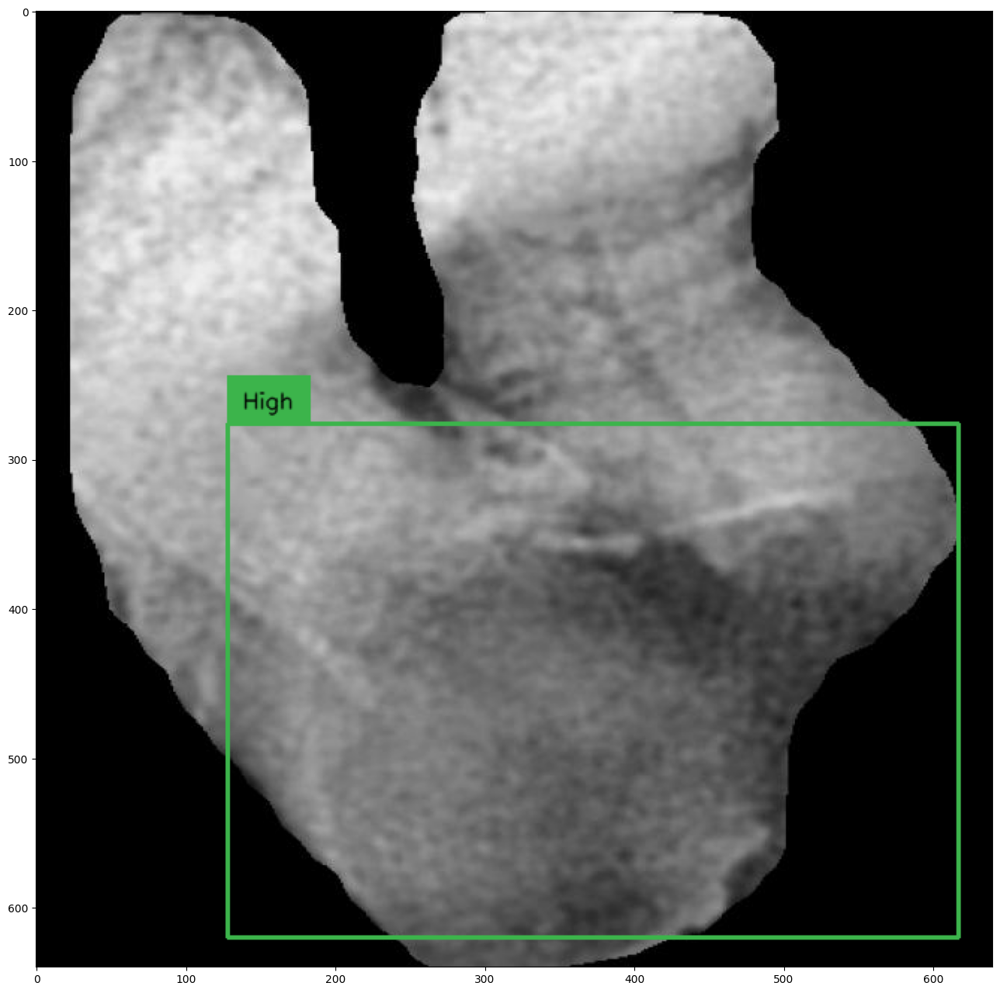

detections


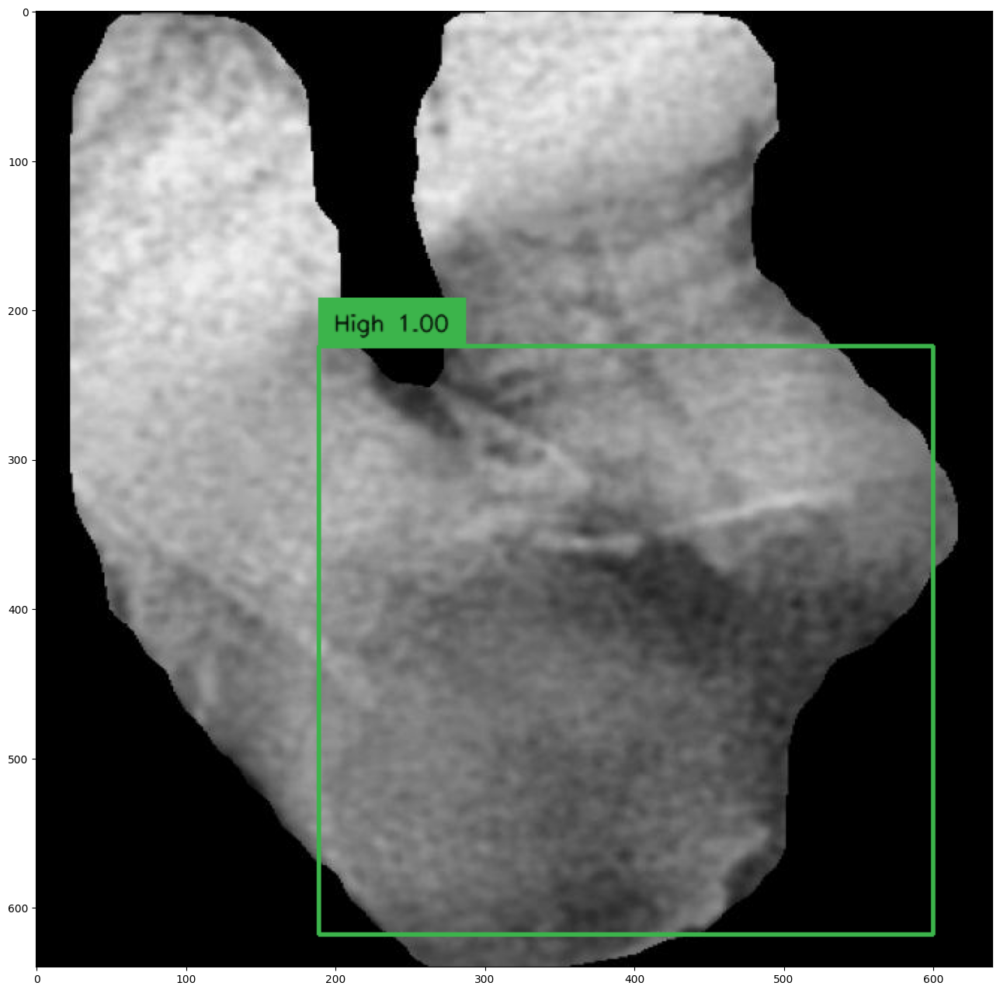

In [ ]:
import random
import cv2
import numpy as np


# utils
categories = TEST_DATASET.coco.cats
id2label = {k: v['name'] for k,v in categories.items()}
box_annotator = sv.BoxAnnotator()

# select random image
image_ids = TEST_DATASET.coco.getImgIds()
image_id = random.choice(image_ids)
print('Image #{}'.format(image_id))

# load image and annotatons
image = TEST_DATASET.coco.loadImgs(image_id)[0]
annotations = TEST_DATASET.coco.imgToAnns[image_id]
image_path = os.path.join(TEST_DATASET.root, image['file_name'])
image = cv2.imread(image_path)

# annotate
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)
labels = [f"{id2label[class_id]}" for _, _, class_id, _ in detections]
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

print('ground truth')
%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

# inference
with torch.no_grad():

    # load image and predict
    inputs = image_processor(images=image, return_tensors='pt').to(DEVICE)
    outputs = model(**inputs)

    # post-process
    target_sizes = torch.tensor([image.shape[:2]]).to(DEVICE)
    results = image_processor.post_process_object_detection(
        outputs=outputs,
        threshold=CONFIDENCE_TRESHOLD,
        target_sizes=target_sizes
    )[0]

# annotate
detections = sv.Detections.from_transformers(transformers_results=results).with_nms(threshold=0.5)
labels = [f"{id2label[class_id]} {confidence:.2f}" for _, confidence, class_id, _ in detections]
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

print('detections')
%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

In [ ]:
!pip install -q coco_eval

  Preparing metadata (setup.py) ... done


In [ ]:
def convert_to_xywh(boxes):
    xmin, ymin, xmax, ymax = boxes.unbind(1)
    return torch.stack((xmin, ymin, xmax - xmin, ymax - ymin), dim=1)

def prepare_for_coco_detection(predictions):
    coco_results = []
    for original_id, prediction in predictions.items():
        if len(prediction) == 0:
            continue

        boxes = prediction["boxes"]
        boxes = convert_to_xywh(boxes).tolist()
        scores = prediction["scores"].tolist()
        labels = prediction["labels"].tolist()

        coco_results.extend(
            [
                {
                    "image_id": original_id,
                    "category_id": labels[k],
                    "bbox": box,
                    "score": scores[k],
                }
                for k, box in enumerate(boxes)
            ]
        )
    return coco_results

In [ ]:
from coco_eval import CocoEvaluator
from tqdm.notebook import tqdm

import numpy as np

evaluator = CocoEvaluator(coco_gt=TEST_DATASET.coco, iou_types=["bbox"])

print("Running evaluation...")

for idx, batch in enumerate(tqdm(TEST_DATALOADER)):
    pixel_values = batch["pixel_values"].to(DEVICE)
    pixel_mask = batch["pixel_mask"].to(DEVICE)
    labels = [{k: v.to(DEVICE) for k, v in t.items()} for t in batch["labels"]]

    with torch.no_grad():
      outputs = model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
    results = image_processor.post_process_object_detection(outputs, target_sizes=orig_target_sizes)

    predictions = {target['image_id'].item(): output for target, output in zip(labels, results)}
    predictions = prepare_for_coco_detection(predictions)
    evaluator.update(predictions)

evaluator.synchronize_between_processes()
evaluator.accumulate()
evaluator.summarize()

Running evaluation...


  0%|          | 0/47 [00:00<?, ?it/s]

Accumulating evaluation results...
DONE (t=0.04s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.304
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.631
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.238
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.304
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.403
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.416
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.416
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area

In [ ]:
# Guardar el modelo completo
model_complete_path = "/content/Checkpoints/detr_complete_model.pth"
torch.save(model, model_complete_path)


In [ ]:
model = torch.load(model_complete_path)
model.eval()

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Detr(
  (model): DetrForObjectDetection(
    (model): DetrModel(
      (backbone): DetrConvModel(
        (conv_encoder): DetrConvEncoder(
          (model): FeatureListNet(
            (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
            (bn1): DetrFrozenBatchNorm2d()
            (act1): ReLU(inplace=True)
            (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
            (layer1): Sequential(
              (0): Bottleneck(
                (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
                (bn1): DetrFrozenBatchNorm2d()
                (act1): ReLU(inplace=True)
                (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
                (bn2): DetrFrozenBatchNorm2d()
                (drop_block): Identity()
                (act2): ReLU(inplace=True)
                (aa): Identity()
                (conv3): Conv2d(64, 256

# **Calculo de metricas**

In [ ]:
import torch
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score
from transformers import DetrImageProcessor, DetrForObjectDetection
from torch.utils.data import DataLoader
import numpy as np

# Configuración del dispositivo
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Ruta al archivo del modelo guardado
model_path = "/content/Checkpoints/detr_complete_model.pth"  # Ajusta esta ruta según la ubicación de tu modelo

# Cargar el modelo en el dispositivo especificado
model = torch.load(model_path)
model.to(DEVICE)
model.eval()  # Coloca el modelo en modo de evaluación

# Procesador de imágenes
image_processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")

# Umbral para la clasificación positiva
confidence_threshold = 0.5

# Dataset de prueba y DataLoader (usar el TEST_DATASET definido en tu código original)
test_loader = DataLoader(TEST_DATASET, batch_size=1, shuffle=False, collate_fn=collate_fn)

# Función para la evaluación en el conjunto de prueba
def evaluate_model_with_auc(model, dataloader, device):
    model.eval()
    all_true_labels = []
    all_pred_labels = []
    all_scores = []
    all_binary_targets = []  # Lista para almacenar si una predicción es correcta (1) o incorrecta (0)

    with torch.no_grad():
        for batch in dataloader:
            pixel_values = batch["pixel_values"].to(device)
            pixel_mask = batch.get("pixel_mask", None).to(device) if "pixel_mask" in batch else None
            labels = [{k: v.to(device) for k, v in t.items()} for t in batch["labels"]]

            # Realizar la predicción
            outputs = model(pixel_values=pixel_values, pixel_mask=pixel_mask)

            # Obtener logits y cajas predichas
            logits = outputs.logits  # [batch_size, num_queries, num_classes]
            scores = torch.softmax(logits, -1)[:, :, :-1].max(-1)[0]  # Confianza sin la clase de fondo
            pred_labels = logits.argmax(-1).cpu().numpy()

            for i, label in enumerate(labels):
                true_labels = label["class_labels"].cpu().numpy()

                # Filtrar las predicciones de alta confianza
                high_conf_indices = scores[i].topk(k=1, dim=0).indices
                pred_labels_filtered = pred_labels[i][high_conf_indices].flatten()
                scores_filtered = scores[i][high_conf_indices].flatten().cpu().numpy()

                # Convertir a formato binario: 1 si es correcto, 0 si es incorrecto
                binary_targets = [1 if p == t else 0 for p, t in zip(pred_labels_filtered, true_labels)]

                # Agregar resultados para las métricas
                all_true_labels.extend(true_labels)
                all_pred_labels.extend(pred_labels_filtered)
                all_scores.extend(scores_filtered)
                all_binary_targets.extend(binary_targets)  # Incluye resultados binarios de predicciones

    # Calcular Precision, Recall y F1-Score
    precision, recall, f1_score, _ = precision_recall_fscore_support(
        all_true_labels, all_pred_labels, average="weighted"
    )

    # Calcular AUC considerando falsos positivos
    try:
        auc = roc_auc_score(all_binary_targets, all_scores)  # Usamos binary_targets como referencia
    except ValueError as e:
        print(f"Error al calcular AUC: {e}")
        auc = None

    # Resultados
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-Score: {f1_score:.4f}")
    if auc is not None:
        print(f"AUC: {auc:.4f}")
    else:
        print("AUC no se calculó debido a un error en la estructura de datos.")

# Llama a la función de evaluación usando el dataloader de prueba
evaluate_model_with_auc(model, test_loader, DEVICE)

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Precision: 0.8649
Recall: 0.7487
F1-Score: 0.8018
AUC: 0.8350


Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.


In [ ]:
import os
import torch
import numpy as np
from PIL import Image
from typing import List, Dict, Tuple
from torch.utils.data import Dataset, DataLoader
from transformers import DetrImageProcessor, DetrForObjectDetection
import json

def post_process_predictions(
    outputs,
    confidence_threshold: float = 0.5
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Post-procesa las salidas del modelo DETR
    """
    # Obtener probabilidades
    probas = outputs.logits.softmax(-1)  # [batch_size, num_queries, num_classes]
    probas = probas.squeeze(0)  # Eliminar dimensión del batch [num_queries, num_classes]

    # Obtener scores y labels
    # Ignorar la clase de fondo (última clase)
    keep_probas = probas[:, :-1]  # [num_queries, num_classes-1]
    scores, labels = keep_probas.max(-1)  # [num_queries]

    # Obtener cajas
    boxes = outputs.pred_boxes.squeeze(0)  # [num_queries, 4]

    # Convertir cajas de [cx, cy, w, h] a [x1, y1, x2, y2]
    x_c, y_c, w, h = boxes.unbind(-1)
    boxes_xyxy = torch.stack([
        x_c - 0.5 * w,
        y_c - 0.5 * h,
        x_c + 0.5 * w,
        y_c + 0.5 * h
    ], dim=-1)

    # Filtrar por umbral de confianza
    keep_mask = scores > confidence_threshold
    filtered_boxes = boxes_xyxy[keep_mask]
    filtered_scores = scores[keep_mask]
    filtered_labels = labels[keep_mask]

    # Convertir a numpy
    return (
        filtered_boxes.detach().cpu().numpy(),
        filtered_scores.detach().cpu().numpy(),
        filtered_labels.detach().cpu().numpy()
    )

def evaluate_iou(
    model: DetrForObjectDetection,
    dataloader: DataLoader,
    device: torch.device,
    iou_threshold: float = 0.5,
    confidence_threshold: float = 0.5
) -> Dict[str, float]:
    """
    Evalúa el modelo usando métricas IoU y otras métricas de detección
    """
    model.eval()
    total_ious = []
    detection_metrics = {
        'mean_iou': 0.0,
        'precision': 0.0,
        'recall': 0.0,
        'f1_score': 0.0
    }

    true_positives = 0
    false_positives = 0
    false_negatives = 0

    with torch.no_grad():
        for batch in dataloader:
            pixel_values = batch["pixel_values"].to(device)
            labels = [{k: v.to(device) for k, v in t.items()} for t in batch["labels"]]

            # Realizar predicción
            outputs = model(pixel_values=pixel_values)

            # Post-procesar predicciones
            pred_boxes, pred_scores, pred_labels = post_process_predictions(
                outputs, confidence_threshold
            )

            # Procesar cada imagen en el batch
            for idx, label in enumerate(labels):
                gt_boxes = label["boxes"].cpu().numpy()

                # Si no hay predicciones después del filtrado
                if len(pred_boxes) == 0:
                    false_negatives += len(gt_boxes)
                    continue

                # Si no hay ground truth boxes
                if len(gt_boxes) == 0:
                    false_positives += len(pred_boxes)
                    continue

                # Calcular matriz IoU
                iou_matrix = np.zeros((len(gt_boxes), len(pred_boxes)))

                for i, gt_box in enumerate(gt_boxes):
                    for j, pred_box in enumerate(pred_boxes):
                        iou_matrix[i, j] = calculate_iou(gt_box, pred_box)

                # Hacer matching
                matched_gt = set()
                matched_pred = set()

                # Ordenar IoUs en orden descendente
                iou_flat = iou_matrix.flatten()
                iou_sorted_idx = np.argsort(iou_flat)[::-1]
                gt_idx, pred_idx = np.unravel_index(iou_sorted_idx, iou_matrix.shape)

                for i in range(len(iou_sorted_idx)):
                    if iou_flat[iou_sorted_idx[i]] < iou_threshold:
                        break

                    gt_i = gt_idx[i]
                    pred_i = pred_idx[i]

                    if gt_i not in matched_gt and pred_i not in matched_pred:
                        matched_gt.add(gt_i)
                        matched_pred.add(pred_i)
                        total_ious.append(iou_flat[iou_sorted_idx[i]])

                # Actualizar contadores
                true_positives += len(matched_gt)
                false_positives += len(pred_boxes) - len(matched_pred)
                false_negatives += len(gt_boxes) - len(matched_gt)

    # Calcular métricas finales
    if total_ious:
        detection_metrics['mean_iou'] = np.mean(total_ious)

    if true_positives + false_positives > 0:
        detection_metrics['precision'] = true_positives / (true_positives + false_positives)

    if true_positives + false_negatives > 0:
        detection_metrics['recall'] = true_positives / (true_positives + false_negatives)

    if detection_metrics['precision'] + detection_metrics['recall'] > 0:
        detection_metrics['f1_score'] = 2 * (detection_metrics['precision'] * detection_metrics['recall']) / (detection_metrics['precision'] + detection_metrics['recall'])

    return detection_metrics
# El resto del código permanece igual...

def main():
    # Configuración
    DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    MODEL_PATH = "/content/Checkpoints/detr_complete_model.pth"  # Ajusta esta ruta
    IMAGE_DIR = "/content/datasets/XÑRadiogra-1/test"  # Ajusta esta ruta
    ANNOTATION_FILE = "/content/datasets/XÑRadiogra-1/test/_annotations.coco.json"  # Ajusta esta ruta
    ANNOTATION_FORMAT = 'coco'  # Puedes cambiar a 'coco' o 'yolo' según tu formato
    BATCH_SIZE = 1
    CONFIDENCE_THRESHOLD = 0.5
    IOU_THRESHOLD = 0.5

    # Crear dataset y dataloader
    test_dataset = CustomDetectionDataset(
        image_dir=IMAGE_DIR,
        annotation_file=ANNOTATION_FILE,
        annotation_format=ANNOTATION_FORMAT
    )

    test_loader = DataLoader(
        test_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        collate_fn=collate_fn
    )

    # Cargar y preparar modelo
    model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50")
    state_dict = torch.load(MODEL_PATH, map_location=DEVICE)
    model.load_state_dict(state_dict)
    model.to(DEVICE)
    model.eval()

    # Evaluar modelo
    metrics = evaluate_iou(
        model=model,
        dataloader=test_loader,
        device=DEVICE,
        confidence_threshold=CONFIDENCE_THRESHOLD,
        iou_threshold=IOU_THRESHOLD
    )

    # Imprimir resultados
    print("\nMétricas de Detección:")
    print(f"IoU Promedio: {metrics['mean_iou']:.4f}")
    print(f"Precisión: {metrics['precision']:.4f}")
    print(f"Recall: {metrics['recall']:.4f}")
    print(f"F1 Score: {metrics['f1_score']:.4f}")

if __name__ == "__main__":
    main()

In [ ]:
torch.save(model.state_dict(), "/content/Checkpoints/detr_complete_model.pth")
